In [0]:
import pandas as pd
import numpy as np


In [27]:
pip install wordcount

  Created wheel for wordcount: filename=wordcount-1.0-cp36-none-any.whl size=2182 sha256=8e898c23ba5cead4ed53ae9dab9650d3ee0132e4e36745e13fcd203aef4df5c7
  Stored in directory: /root/.cache/pip/wheels/8a/4e/8e/dc4b2a09da246cb76821e40c410c2a7e238b1242b669182e94
Successfully built wordcount


In [28]:
pip install keras

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelBinarizer
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud,STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize,sent_tokenize
from bs4 import BeautifulSoup
import re,string,unicodedata
from nltk.tokenize.toktok import ToktokTokenizer
from nltk.stem import PorterStemmer,WordNetLemmatizer
from sklearn.linear_model import LogisticRegression,SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.model_selection import train_test_split
from string import punctuation
from nltk import pos_tag
from nltk.corpus import wordnet
#import keras
#from keras.models import Sequential

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
df = pd.read_csv(open('/content/drive/My Drive/Colab Notebooks/news.csv','rb'))
df

,Unnamed: 0,authors,title,publish_date,description,text,url
0,0,['Cbc News'],Coronavirus a 'wake-up call' for Canada's pres...,2020-03-27 08:00:00,Canadian pharmacies are limiting how much medi...,Canadian pharmacies are limiting how much medi...,https://www.cbc.ca/news/health/covid-19-drug-s...
1,1,['Cbc News'],Yukon gov't names 2 possible sources of corona...,2020-03-27 01:45:00,The Yukon government has identified two places...,The Yukon government has identified two places...,https://www.cbc.ca/news/canada/north/yukon-cor...
2,2,['The Associated Press'],U.S. Senate passes $2T coronavirus relief package,2020-03-26 05:13:00,The Senate has passed an unparalleled $2.2 tri...,The Senate late Wednesday passed an unparallel...,https://www.cbc.ca/news/world/senate-coronavir...
3,3,['Cbc News'],Coronavirus: The latest in drug treatment and ...,2020-03-27 00:36:00,Scientists around the world are racing to find...,Scientists around the world are racing to find...,https://www.cbc.ca/news/health/coronavirus-tre...
4,4,['Cbc News'],The latest on the coronavirus outbreak for Mar...,2020-03-26 20:57:00,The latest on the coronavirus outbreak from CB...,Trudeau says rules of Quarantine Act will ...,https://www.cbc.ca/news/the-latest-on-the-coro...
...,...,...,...,...,...,...,...
3561,4604,['The Associated Press'],South Korea declares end to MERS virus outbreak,2015-12-23 09:07:00,South Korea on Wednesday declared a formal end...,South Korea on Wednesday declared a formal end...,https://www.cbc.ca/news/health/korea-mers-outb...
3562,4605,['The Canadian Press'],MERS virus spread in hospitals should be focus...,2014-01-28 16:07:00,The spread of MERS coronavirus infections in h...,The spread of MERS coronavirus infections in h...,https://www.cbc.ca/news/health/mers-virus-spre...
3563,4606,['Cbc News'],Ellershausen Manor is for sale,2012-11-02 01:24:00,A clasic old home with a lot of history in now...,"It's a relic of a bygone era, when wealthy Nov...",https://www.cbc.ca/news/canada/nova-scotia/ell...
3564,4607,['Cbc News'],MERS virus from camels and humans called indis...,2014-04-29 16:57:00,Camels have been implicated in a Middle Easter...,Camels have been implicated in a Middle Easter...,https://www.cbc.ca/news/health/mers-virus-from...


In [4]:
text=df[["text"]]
text

,text
0,Canadian pharmacies are limiting how much medi...
1,The Yukon government has identified two places...
2,The Senate late Wednesday passed an unparallel...
3,Scientists around the world are racing to find...
4,Trudeau says rules of Quarantine Act will ...
...,...
3561,South Korea on Wednesday declared a formal end...
3562,The spread of MERS coronavirus infections in h...
3563,"It's a relic of a bygone era, when wealthy Nov..."
3564,Camels have been implicated in a Middle Easter...


In [5]:
list=text['text'].tolist()
list

['Canadian pharmacies are limiting how much medication can be dispensed to try to prevent shortages, recognizing that most active ingredients for drugs come from India and China and medical supply chains have been disrupted by the spread of COVID-19. Provincial regulatory colleges are complying with the Canadian Pharmacists Association call to limit the amount of medications given to patients to 30-day\xa0supplies. The goal is to stop people from refilling prescriptions early and to ensure life-saving drugs don\'t run short when supply chains are\xa0vulnerable. Mina Tadrous is a pharmacist and researcher in Toronto who monitors pharmaceutical supplies. He is worried Canadians will start stockpiling drugs after watching what has been unfolding in the U.S. and other regions as the virus spreads.\xa0 He said pharmacists are concerned about drugs such as life-saving inhalers that people might stockpile based on misinformation circulating about potential treatments for COVID-19. "It\'s that

In [7]:
dict = { i : list[i] for i in range(0, len(list)) }
dict

{0: 'Canadian pharmacies are limiting how much medication can be dispensed to try to prevent shortages, recognizing that most active ingredients for drugs come from India and China and medical supply chains have been disrupted by the spread of COVID-19. Provincial regulatory colleges are complying with the Canadian Pharmacists Association call to limit the amount of medications given to patients to 30-day\xa0supplies. The goal is to stop people from refilling prescriptions early and to ensure life-saving drugs don\'t run short when supply chains are\xa0vulnerable. Mina Tadrous is a pharmacist and researcher in Toronto who monitors pharmaceutical supplies. He is worried Canadians will start stockpiling drugs after watching what has been unfolding in the U.S. and other regions as the virus spreads.\xa0 He said pharmacists are concerned about drugs such as life-saving inhalers that people might stockpile based on misinformation circulating about potential treatments for COVID-19. "It\'s t

In [8]:
!pip install tmtoolkit

import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

     |████████████████████████████████| 19.9MB 1.2MB/s 
     |████████████████████████████████| 2.3MB 24.1MB/s 
     |████████████████████████████████| 112kB 45.2MB/s 
     |████████████████████████████████| 1.4MB 41.0MB/s 
     |████████████████████████████████| 22.1MB 1.4MB/s 
     |████████████████████████████████| 3.0MB 35.2MB/s 
  Created wheel for globre: filename=globre-0.1.5-cp36-none-any.whl size=19528 sha256=0d1b7c45bffd715b1312037baaaf48fc4813db192ae18fcd549d89d2b5de543a
  Stored in directory: /root/.cache/pip/wheels/c4/3f/7f/be546f6d880521a8a7a1fe84cbe135fa859be63084682d3292
  Created wheel for nltk: filename=nltk-3.5-cp36-none-any.whl size=1434676 sha256=6d82d3d6d27b3fbdebf62ff8bb1b3051a7eba9665caa49a782f082e841587d84
  Stored in directory: /root/.cache/pip/wheels/ae/8c/3f/b1fe0ba04555b08b57ab52ab7f86023639a526d8bc8d384306
Successfully built globre nltk
  Found existing installation: nltk 3.2.5
    Uninstalling nltk-3.2.5:
      Successfully uninstalled nltk-3.2.5
  Found 

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [0]:
import random
random.seed(20191120) #to make sampling reproducible
np.set_printoptions(precision=5)
from tmtoolkit.corpus import Corpus
corpus= Corpus()

for key in dict:
   corpus.add_doc(str(key),dict[key])

lda_params ={
    'n_topics':50,
    'eta':0.01,
    'n_iter':1000,
    'random_state':20191120
} # set parameters

In [10]:
from tmtoolkit.preprocess import TMPreproc

preproc = TMPreproc(corpus)
preproc.pos_tag()
preproc.lemmatize()
preproc.tokens_to_lowercase()
preproc.remove_special_chars_in_tokens()

<TMPreproc [3566 documents]>

In [11]:
preproc.tokens['91']

['the',
 'coronavirus',
 'outbreak',
 'have',
 'result',
 'in',
 'a',
 'deluge',
 'of',
 'information',
 '',
 'but',
 'health',
 'and',
 'safety',
 'advisory',
 'may',
 'be',
 'at',
 'risk',
 'of',
 'get',
 'lose',
 'in',
 'the',
 'fray',
 '',
 'cbc',
 'news',
 'bureau',
 'across',
 'canada',
 'have',
 'compile',
 'the',
 'late',
 '',
 'locally',
 'relevant',
 'announcement',
 '',
 'cancellation',
 'and',
 'update',
 'on',
 'the',
 'outbreak',
 'in',
 'an',
 'ongoing',
 'effort',
 'to',
 'keep',
 'canadians',
 'inform',
 'on',
 'what',
 'resource',
 'be',
 'available',
 'in',
 'their',
 'community',
 '',
 'livewatch',
 'the',
 'late',
 'from',
 'cbc',
 'news',
 'network',
 'herewhat',
 'to',
 'do',
 'if',
 'you',
 'think',
 'you',
 'have',
 'covid19',
 '',
 'a',
 'guide',
 'to',
 'each',
 'province',
 'and',
 'territory',
 'get',
 'up',
 'to',
 'speed',
 'on',
 'the',
 'late',
 'coronavirus',
 'information',
 'from',
 'your',
 'part',
 'of',
 'the',
 'country',
 'here',
 '',
 'alberta'

In [12]:
preproc.vocabulary_size

37895

In [13]:
preproc_smaller = preproc.copy()
preproc_smaller.filter_for_pos('N')
preproc_smaller.clean_tokens(remove_numbers=True,remove_shorter_than=2)
preproc_smaller.remove_common_tokens(df_threshold=0.8)
#preproc_smaller.remove_uncommon_tokens(df_threshold=0.005)

print(preproc.vocabulary_size)
print(preproc_smaller.vocabulary_size)

37895
26856


In [14]:
doc_labels = np.array(preproc.doc_labels) # convert labels to np.array
doc_labels[:10]

array(['0', '1', '10', '100', '1000', '1001', '1002', '1003', '1004',
       '1005'], dtype='<U4')

In [0]:
vocab_bg = np.array(preproc.vocabulary)
vocab_sm = np.array(preproc_smaller.vocabulary)

In [0]:
vocab_bg = np.array(preproc.vocabulary)
vocab_sm = np.array(preproc_smaller.vocabulary)

In [18]:
dtm_bg = preproc.dtm
dtm_sm = preproc_smaller.dtm
dtm_bg,dtm_sm
#create two models

(<3566x37895 sparse matrix of type '<class 'numpy.int32'>'
 	with 1093406 stored elements in Compressed Sparse Row format>,
 <3566x26856 sparse matrix of type '<class 'numpy.int32'>'
 	with 465059 stored elements in Compressed Sparse Row format>)

In [19]:
!pip install tmtoolkit['lda']
import logging
import warnings
from tmtoolkit.topicmod.tm_lda import compute_models_parallel

logger = logging.getLogger('lda')
logger.addHandler(logging.NullHandler())
logger.propagate = False

warnings.filterwarnings('ignore')

# set data to use
dtms = {'bigger':dtm_bg,'smaller':dtm_sm}
# and fixedhyperparameters
lda_params ={'n_topics':16,
             'eta':.001,
             'n_iter':1000,
             'random_state':20191122}# make results reproductible

models = compute_models_parallel(dtms,constant_parameters=lda_params)

     |████████████████████████████████| 358kB 5.0MB/s 
     |████████████████████████████████| 102kB 7.5MB/s 


In [20]:
from tmtoolkit.topicmod.model_io import print_ldamodel_topic_words

model_sm=models['smaller'][0][1]
print_ldamodel_topic_words(model_sm.topic_word_,vocab_sm,top_n=5) # use smaller dtm to get topic modelings

topic_1
> #1. nova (0.032423)
> #2. scotia (0.030663)
> #3. company (0.015772)
> #4. store (0.014164)
> #5. product (0.014134)
topic_2
> #1. school (0.069006)
> #2. student (0.054880)
> #3. university (0.025226)
> #4. child (0.019844)
> #5. parent (0.019732)
topic_3
> #1. http (0.035554)
> #2. href (0.030999)
> #3. time (0.015585)
> #4. amp (0.014840)
> #5. mdash (0.013523)
topic_4
> #1. canada (0.047294)
> #2. flight (0.040587)
> #3. canadians (0.031455)
> #4. travel (0.025819)
> #5. government (0.023475)
topic_5
> #1. worker (0.034385)
> #2. employee (0.019162)
> #3. business (0.019162)
> #4. service (0.019071)
> #5. home (0.013986)
topic_6
> #1. us (0.025526)
> #2. country (0.021555)
> #3. coronavirus (0.017486)
> #4. italy (0.015661)
> #5. state (0.015612)
topic_7
> #1. cent (0.021904)
> #2. price (0.017796)
> #3. business (0.016944)
> #4. year (0.015732)
> #5. oil (0.015695)
topic_8
> #1. coronavirus (0.043231)
> #2. china (0.038752)
> #3. case (0.037629)
> #4. virus (0.036881)
> 

In [21]:
model_bg=models['bigger'][0][1]
print_ldamodel_topic_words(model_bg.topic_word_,vocab_bg,top_n=5) # use bigger dtm to get topic modeling

topic_1
> #1.  (0.249116)
> #2. a (0.054926)
> #3. the (0.036728)
> #4. and (0.019701)
> #5. of (0.018530)
topic_2
> #1.  (0.106289)
> #2. to (0.060974)
> #3. the (0.037740)
> #4. be (0.030539)
> #5. for (0.018938)
topic_3
> #1.  (0.121118)
> #2. to (0.031897)
> #3. be (0.030005)
> #4. and (0.029006)
> #5. you (0.019045)
topic_4
> #1.  (0.139204)
> #2. be (0.044227)
> #3. to (0.035299)
> #4. the (0.032171)
> #5. say (0.022568)
topic_5
> #1.  (0.117260)
> #2. the (0.046781)
> #3. to (0.036927)
> #4. be (0.032647)
> #5. of (0.028695)
topic_6
> #1.  (0.106870)
> #2. the (0.052137)
> #3. in (0.033007)
> #4. be (0.031661)
> #5. of (0.024219)
topic_7
> #1.  (0.120040)
> #2. the (0.045643)
> #3. and (0.031048)
> #4. of (0.023664)
> #5. to (0.019911)
topic_8
> #1.  (0.101282)
> #2. the (0.066194)
> #3. in (0.031603)
> #4. be (0.028583)
> #5. of (0.025639)
topic_9
> #1.  (0.095345)
> #2. the (0.050191)
> #3. be (0.032731)
> #4. of (0.025699)
> #5. to (0.022873)
topic_10
> #1.  (0.120901)
> #2. 

In [23]:
df.authors.unique()

array(["['Cbc News']", "['The Associated Press']",
       "['Mark Gollom Is A Toronto-Based Reporter With Cbc News. He Covers Canadian', 'U.S. Politics', 'Current Affairs.']",
       "['Thomson Reuters']",
       "['Leah Hendry Is A Tv', 'Radio', 'Online Journalist With Cbc Montreal Investigates. Contact Her Via Our Confidential Tipline', 'Or On Email At Montrealinvestigates Cbc.Ca.', 'Follow Leah On Twitter']",
       "['Reporter', 'Web Writer For Cbc Saskatoon', 'Story Tips', 'Ideas Welcomed At Guy.Quenneville Cbc.Ca', 'Follow Guy On Twitter']",
       '[\'Jorge Barrera Is A Caracas-Born\', \'Award-Winning Journalist Who Has Worked Across The Country\', "Internationally. He Works For Cbc\'S Indigenous Unit Based Out Of Ottawa. Follow Him On Twitter", \'Jorgebarrera Or Email Him Jorge.Barrera Cbc.Ca.\', \'Follow\', \'Jorgebarrera On Twitter\']',
       "['Colleen M. Flood Is Director Of The Centre For Health Law', 'Policy', 'Ethics', 'University Research Chair At The University Of Ott

In [0]:
# replace [] with unknown
df.authors.replace("[]","Unknown",inplace=True)

In [0]:
authors=df.authors.value_counts().index.values[:5]
frequency=df.authors.value_counts().values[:5]
authors_pd=pd.DataFrame(columns=['authors','frequency'])
authors_pd['authors']=authors
authors_pd['frequency']=frequency

[Text(0, 0.5, ''), Text(0.5, 0, 'Number of articles written by Top 5 media')]

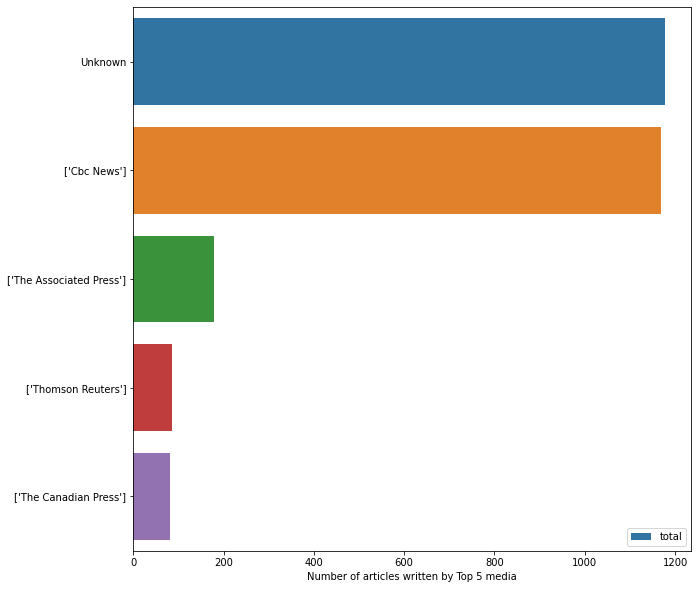

In [30]:
# make histogram to show number of articles written by top 5 authors
ay,ax=plt.subplots(figsize=(10,10))
sns.barplot(x="frequency",y="authors",data=authors_pd,label="total")
sns.set_color_codes("muted")
ax.legend(ncol=2,loc="lower right",frameon=True)
ax.set(ylabel="",xlabel="Number of articles written by Top 5 media")

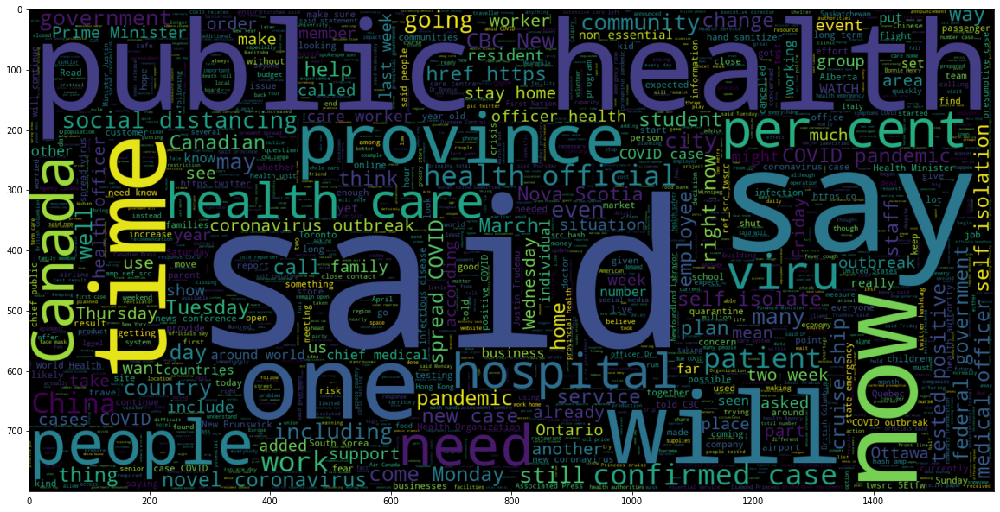

In [32]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 3000 , width = 1600 , height = 800).generate(" ".join(df.text))
plt.imshow(wc , interpolation = 'bilinear')